In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm

In [7]:
import os, glob
import cv2
import PIL

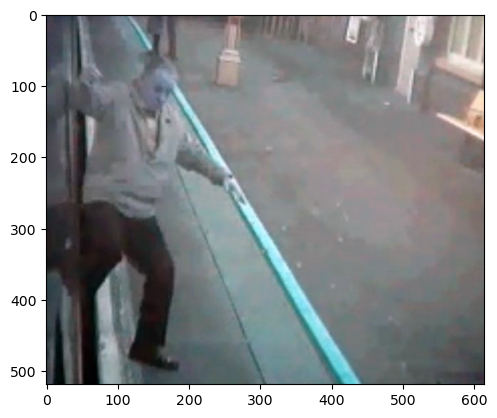

In [3]:
DATADIR = "C:\\railway"
CATEGORIES = ["fall", "not_fall","risky"]
for category in CATEGORIES:  
    path = os.path.join(DATADIR,category)  
    for img in os.listdir(path):  
        img_array = cv2.imread(os.path.join(path,img))  # convert to array
        plt.imshow(img_array)  # graph it
        plt.show()  # display!

        break  # we just want one for now so break
    break  #...and one more!

In [4]:
 print(img_array.shape)

(519, 615, 3)


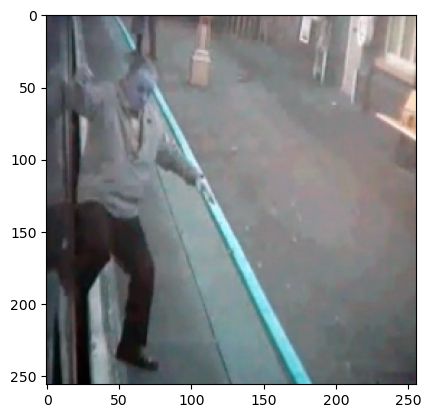

In [5]:
IMG_SIZE = 256

new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
plt.imshow(new_array)
plt.show()

In [6]:
new_array.shape

(256, 256, 3)

In [8]:
import pathlib
data_dir=pathlib.Path(DATADIR)

In [9]:
data_dir

WindowsPath('C:/railway')

In [10]:
len(list(data_dir.glob('*/*.jpg')))

763

In [11]:
fall=list(data_dir.glob('fall/*'))
fall[:5]

[WindowsPath('C:/railway/fall/F_01.jpg'),
 WindowsPath('C:/railway/fall/F_02.jpg'),
 WindowsPath('C:/railway/fall/F_03.jpg'),
 WindowsPath('C:/railway/fall/F_04.jpg'),
 WindowsPath('C:/railway/fall/F_05.jpg')]

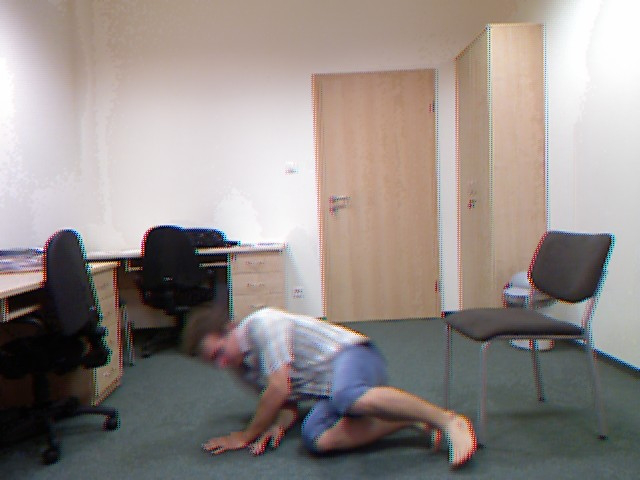

In [12]:
PIL.Image.open(str(fall[190]))

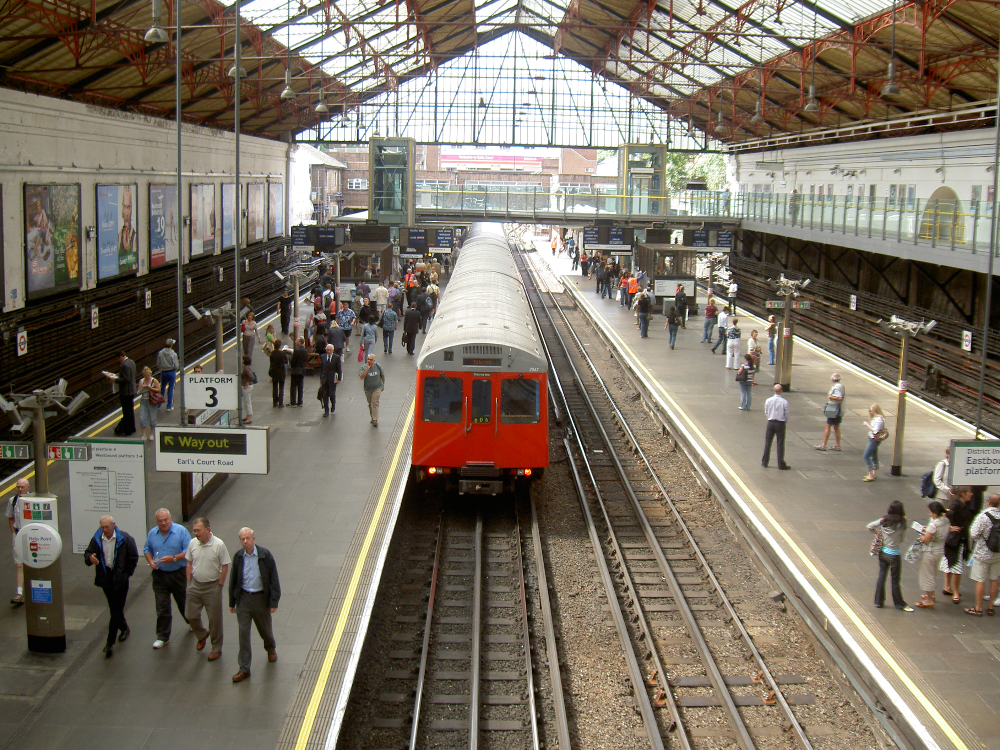

In [13]:
not_fall=list(data_dir.glob('not_fall/*'))
PIL.Image.open(str(not_fall[0]))

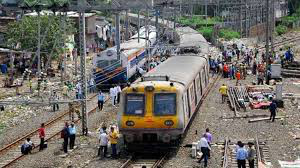

In [15]:
risky=list(data_dir.glob('risky/*'))
PIL.Image.open(str(risky[40]))

In [16]:
railway_images_dict={
    'fall': list(data_dir.glob('fall/*')),
    'not_fall' : list(data_dir.glob('not_fall/*')),
    'risky' : list(data_dir.glob('risky/*'))
}

In [17]:
railway_images_dict['fall']

[WindowsPath('C:/railway/fall/F_01.jpg'),
 WindowsPath('C:/railway/fall/F_02.jpg'),
 WindowsPath('C:/railway/fall/F_03.jpg'),
 WindowsPath('C:/railway/fall/F_04.jpg'),
 WindowsPath('C:/railway/fall/F_05.jpg'),
 WindowsPath('C:/railway/fall/F_06.jpg'),
 WindowsPath('C:/railway/fall/F_07.jpg'),
 WindowsPath('C:/railway/fall/F_08.jpg'),
 WindowsPath('C:/railway/fall/F_09.jpg'),
 WindowsPath('C:/railway/fall/F_10.jpg'),
 WindowsPath('C:/railway/fall/F_100.jpg'),
 WindowsPath('C:/railway/fall/F_101.jpg'),
 WindowsPath('C:/railway/fall/F_102.jpg'),
 WindowsPath('C:/railway/fall/F_103.jpg'),
 WindowsPath('C:/railway/fall/F_104.jpg'),
 WindowsPath('C:/railway/fall/F_105.jpg'),
 WindowsPath('C:/railway/fall/F_106.jpg'),
 WindowsPath('C:/railway/fall/F_107.jpg'),
 WindowsPath('C:/railway/fall/F_108.jpg'),
 WindowsPath('C:/railway/fall/F_109.jpg'),
 WindowsPath('C:/railway/fall/F_11.jpg'),
 WindowsPath('C:/railway/fall/F_110.jpg'),
 WindowsPath('C:/railway/fall/F_111.jpg'),
 WindowsPath('C:/railw

In [18]:
railway_labels_dict = {
    'fall' : 0,
    'not_fall' : 1,
    'risky' : 2
}

In [20]:
img = cv2.imread(str(railway_images_dict['fall'][0]))
img.shape

(519, 615, 3)

In [21]:
cv2.resize(img,(256,256)).shape

(256, 256, 3)

In [78]:
X, y = [], []

for category, images in railway_images_dict.items():
    for image in images:
        img = cv2.imread(str(image))
        resized_img = cv2.resize(img,(256,256))
        X.append(resized_img)
        y.append(railway_labels_dict[category])

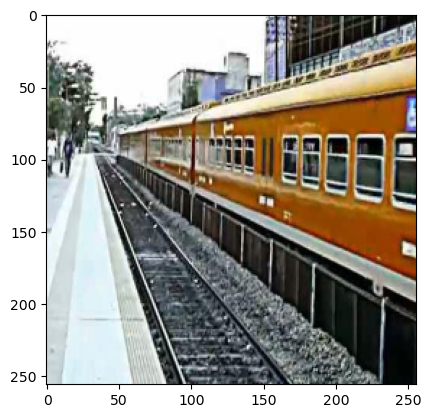

In [79]:
plt.imshow(X[500])

In [80]:
X = np.array(X)
y = np.array(y)

In [81]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [82]:
X_train_scaled = X_train / 255
X_test_scaled = X_test / 255

In [83]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from tensorflow.keras import datasets, layers, models

In [53]:
num_classes = 3

model = Sequential([
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(X_train_scaled, y_train, epochs=30) 

Epoch 1/30
18/18 [==============================] - 11s 503ms/step - loss: 1.4145 - accuracy: 0.3892
Epoch 2/30
18/18 [==============================] - 8s 468ms/step - loss: 0.9819 - accuracy: 0.5654
Epoch 3/30
18/18 [==============================] - 9s 490ms/step - loss: 0.7761 - accuracy: 0.6597
Epoch 4/30
18/18 [==============================] - 9s 477ms/step - loss: 0.5383 - accuracy: 0.7696
Epoch 5/30
18/18 [==============================] - 9s 486ms/step - loss: 0.4675 - accuracy: 0.7976
Epoch 6/30
18/18 [==============================] - 9s 476ms/step - loss: 0.3548 - accuracy: 0.8813
Epoch 7/30
18/18 [==============================] - 9s 491ms/step - loss: 0.2321 - accuracy: 0.9180
Epoch 8/30
18/18 [==============================] - 9s 504ms/step - loss: 0.1366 - accuracy: 0.9616
Epoch 9/30
18/18 [==============================] - 9s 503ms/step - loss: 0.0662 - accuracy: 0.9878
Epoch 10/30
18/18 [==============================] - 9s 485ms/step - loss: 0.0334 - accuracy: 0.996

In [54]:
model.evaluate(X_test_scaled,y_test)

6/6 [==============================] - 1s 86ms/step - loss: 0.6079 - accuracy: 0.9062


[0.6078634262084961, 0.90625]

In [55]:
predictions = model.predict(X_test_scaled)
predictions

6/6 [==============================] - 1s 107ms/step


array([[-3.34618759e+00, -9.74405646e-01,  2.26903892e+00],
       [ 2.53386712e+00, -1.65079546e+00, -2.84780836e+00],
       [ 6.50298738e+00, -1.05096331e+01, -3.87475759e-01],
       [ 1.16231766e+01, -9.37843037e+00, -4.35423517e+00],
       [ 3.74651885e+00, -4.66080236e+00, -1.44936585e+00],
       [ 5.46905696e-01, -4.26445293e+00,  2.05144420e-01],
       [-7.74300957e+00, -4.06402588e+00,  7.07193184e+00],
       [ 1.05545855e+01, -1.29314060e+01, -1.14445353e+00],
       [-5.98034382e+00,  8.81081009e+00, -3.28028727e+00],
       [ 7.71780670e-01,  4.90383577e+00, -7.07798862e+00],
       [ 2.65740633e+00, -4.17654181e+00, -2.77816844e+00],
       [-5.90889502e+00,  5.38956547e+00, -2.16440201e+00],
       [ 6.52457571e+00, -6.15569448e+00, -3.20695734e+00],
       [-5.56780398e-01, -1.14123020e+01,  6.41622829e+00],
       [-7.89005995e+00, -7.73916006e+00,  9.89474106e+00],
       [-2.97371149e+00, -2.11399341e+00,  3.00247669e+00],
       [ 6.95858049e+00, -6.22894335e+00

In [56]:
score = tf.nn.softmax(predictions[0])

In [57]:
np.argmax(score)

2

In [58]:
y_test[0]

2

In [84]:
data_augmentation = keras.Sequential(
  [
    layers.experimental.preprocessing.RandomFlip("horizontal", 
                                                 input_shape=(256, 
                                                              256,
                                                              3)),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ]
)

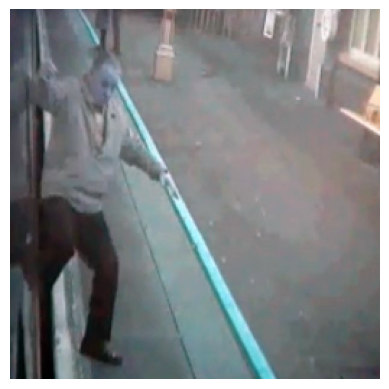

In [85]:
plt.axis('off')
plt.imshow(X[0])

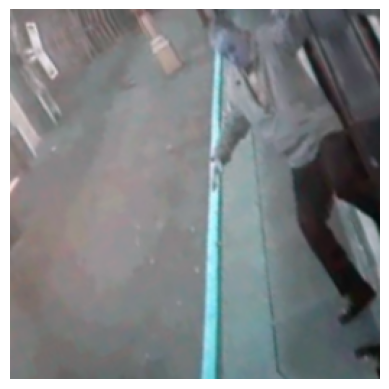

In [86]:
plt.axis('off')
plt.imshow(data_augmentation(X)[0].numpy().astype("uint8"))

In [62]:
num_classes = 3

model = Sequential([
  data_augmentation,
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(X_train_scaled, y_train, epochs=30)    

Epoch 1/30
18/18 [==============================] - 13s 524ms/step - loss: 1.0119 - accuracy: 0.5061
Epoch 2/30
18/18 [==============================] - 9s 526ms/step - loss: 0.9100 - accuracy: 0.5951
Epoch 3/30
18/18 [==============================] - 10s 532ms/step - loss: 0.7479 - accuracy: 0.6562
Epoch 4/30
18/18 [==============================] - 9s 525ms/step - loss: 0.6549 - accuracy: 0.7208
Epoch 5/30
18/18 [==============================] - 10s 533ms/step - loss: 0.6238 - accuracy: 0.7312
Epoch 6/30
18/18 [==============================] - 10s 530ms/step - loss: 0.6046 - accuracy: 0.7504
Epoch 7/30
18/18 [==============================] - 9s 525ms/step - loss: 0.5570 - accuracy: 0.7766
Epoch 8/30
18/18 [==============================] - 10s 535ms/step - loss: 0.5221 - accuracy: 0.7906
Epoch 9/30
18/18 [==============================] - 10s 536ms/step - loss: 0.5006 - accuracy: 0.8010
Epoch 10/30
18/18 [==============================] - 10s 558ms/step - loss: 0.4756 - accuracy:

In [63]:
model.evaluate(X_test_scaled,y_test)

6/6 [==============================] - 1s 99ms/step - loss: 0.5362 - accuracy: 0.8594


[0.5361555218696594, 0.859375]

In [64]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_4 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 45, 45, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_11 (Conv2D)          (None, 45, 45, 64)       

In [87]:
num_classes = 3

model = Sequential([
  data_augmentation,
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(64, activation='relu'),
  layers.Dense(32, activation='relu'),
  layers.Dropout(0.1),
  layers.Dense(32, activation='relu'),
  layers.Dropout(0.1), 
  layers.Dense(num_classes)
])

model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])
              
model.fit(X_train_scaled, y_train, epochs=30)    

Epoch 1/30
18/18 [==============================] - 80s 4s/step - loss: 1.4322 - accuracy: 0.4695
Epoch 2/30
18/18 [==============================] - 71s 4s/step - loss: 0.9997 - accuracy: 0.5288
Epoch 3/30
18/18 [==============================] - 73s 4s/step - loss: 0.9359 - accuracy: 0.5724
Epoch 4/30
18/18 [==============================] - 69s 4s/step - loss: 0.9733 - accuracy: 0.5428
Epoch 5/30
18/18 [==============================] - 70s 4s/step - loss: 0.9324 - accuracy: 0.5794
Epoch 6/30
18/18 [==============================] - 237s 14s/step - loss: 0.8822 - accuracy: 0.5934
Epoch 7/30
18/18 [==============================] - 71s 4s/step - loss: 0.8688 - accuracy: 0.6283
Epoch 8/30
18/18 [==============================] - 69s 4s/step - loss: 0.8838 - accuracy: 0.6003
Epoch 9/30
18/18 [==============================] - 69s 4s/step - loss: 0.8561 - accuracy: 0.6021
Epoch 10/30
18/18 [==============================] - 69s 4s/step - loss: 0.8062 - accuracy: 0.6370
Epoch 11/30
18/18

In [88]:
model.evaluate(X_test_scaled,y_test)

6/6 [==============================] - 4s 536ms/step - loss: 0.5976 - accuracy: 0.7917


[0.5976253151893616, 0.7916666865348816]

In [89]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_7 (Sequential)   (None, 256, 256, 3)       0         
                                                                 
 conv2d_14 (Conv2D)          (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_15 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 max_pooling2d_15 (MaxPoolin  (None, 64, 64, 128)      0         
 g2D)                                                            
                                                                 
 flatten_5 (Flatten)         (None, 524288)           

In [92]:
import numpy as np
import cv2

import PIL.Image as Image
import os

import matplotlib.pylab as plt

import tensorflow as tf
import tensorflow_hub as hub

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential


In [91]:
pip install tensorflow_hub


     ------------------------------------ 100.6/100.6 kB 645.1 kB/s eta 0:00:00


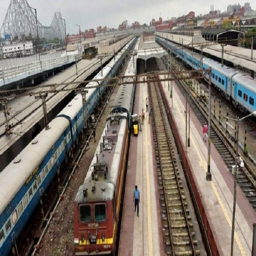

In [138]:
IMAGE_SHAPE = (256, 256)
Fall_test = Image.open("not_fall3.jpg").resize(IMAGE_SHAPE)
Fall_test

In [139]:
Fall_test = np.array(Fall_test)/255.0
Fall_test.shape

(256, 256, 3)

In [140]:
Fall_test[np.newaxis, ...]

array([[[[0.85098039, 0.84705882, 0.87058824],
         [0.85098039, 0.84705882, 0.87058824],
         [0.85098039, 0.84705882, 0.87058824],
         ...,
         [0.90980392, 0.90980392, 0.90196078],
         [0.90588235, 0.90588235, 0.89803922],
         [0.89803922, 0.89803922, 0.89019608]],

        [[0.8627451 , 0.85882353, 0.88235294],
         [0.8627451 , 0.85882353, 0.88235294],
         [0.8627451 , 0.85882353, 0.88235294],
         ...,
         [0.90588235, 0.90588235, 0.89803922],
         [0.90196078, 0.90196078, 0.89411765],
         [0.89803922, 0.89803922, 0.89019608]],

        [[0.86666667, 0.8627451 , 0.88627451],
         [0.86666667, 0.8627451 , 0.88627451],
         [0.86666667, 0.8627451 , 0.88627451],
         ...,
         [0.90588235, 0.90588235, 0.89803922],
         [0.90588235, 0.90588235, 0.89411765],
         [0.90196078, 0.90588235, 0.89411765]],

        ...,

        [[0.08627451, 0.18823529, 0.27843137],
         [0.03921569, 0.14117647, 0.22745098]

In [141]:
result = model.predict(Fall_test[np.newaxis, ...])
result.shape

1/1 [==============================] - 0s 117ms/step


(1, 3)

In [151]:
predicted_label_index = np.argmax(result)
predicted_label_index

1

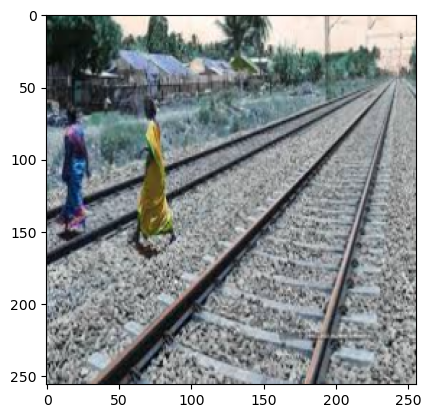

In [152]:
plt.imshow(X_test[15])

In [150]:
y_test[15]

2

In [161]:
classes=["fall","not_fall","risky"]

In [162]:
classes[2]

'risky'